# Practical Bioinformatics / HW 8 - MEME

**Search for the binding site of the transcription factor regulating purine synthesis using MEME.**

1. Go to the Uniprot website and open the advanced search (https://www.uniprot.org).

1.1. In the upper window, on the left side, select the "Keyword" field, then, on the right side, start typing the words "Purine biosynthesis". You need to click on the hint because the keywords in Uniprot are taken from a fixed list.

1.2. In the next window on the left side, select "Organism", then, in the right side, copy the genus and the type of bacteria from the Homework inputs data table. In this case, you do *not* need to use the system prompt and add something else (p.s. for many types of bacteria, there are a large number of strains).

btw, my organism of interest is *Pseudomonas aeruginosa*.


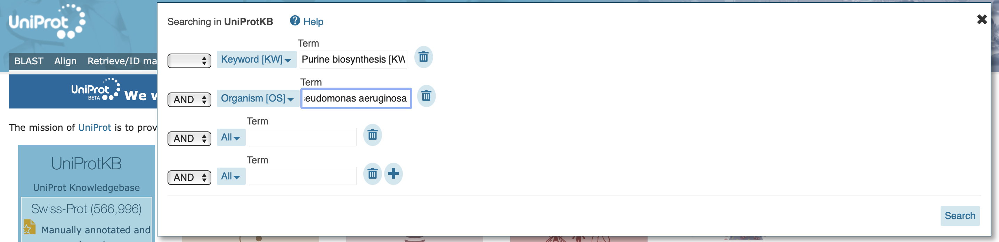

1.3. Click on the magnifier image to start the search. Wait for the result.

2. On the page with the results, on the left side, find the hyperlink "Reviewed" and click on it (-> we only need well-annotated proteins).

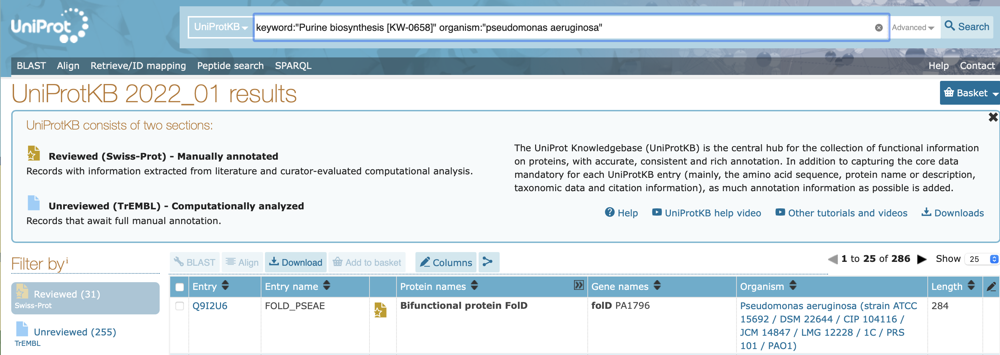

3. Select a strain for which there are at least 8 proteins annotated in the appropriate way, then click on the corresponding hyperlink on the left side in “Popular organisms".

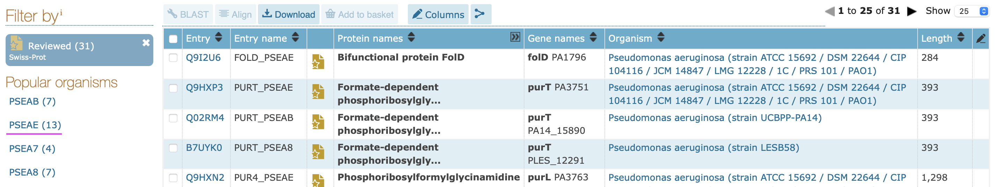

3.1. If there are too many (more than 10) proteins in the resulting list, select 8-10 of them.

Write in the report: the full name of the selected strain, its Uniprot mnemonics, a list of selected proteins (the first three columns, from the third column - only highlighted in bold), a list of gene names.
_________________________
The full name of the selected strain - strain ATCC 15692 / DSM 22644 / CIP 104116 / JCM 14847 / LMG 12228 / 1C / PRS 101 / PAO1,

its Uniprot mnemonics - PSEAE,

a list of selected proteins + a list of gene names (for the first 10 rows):


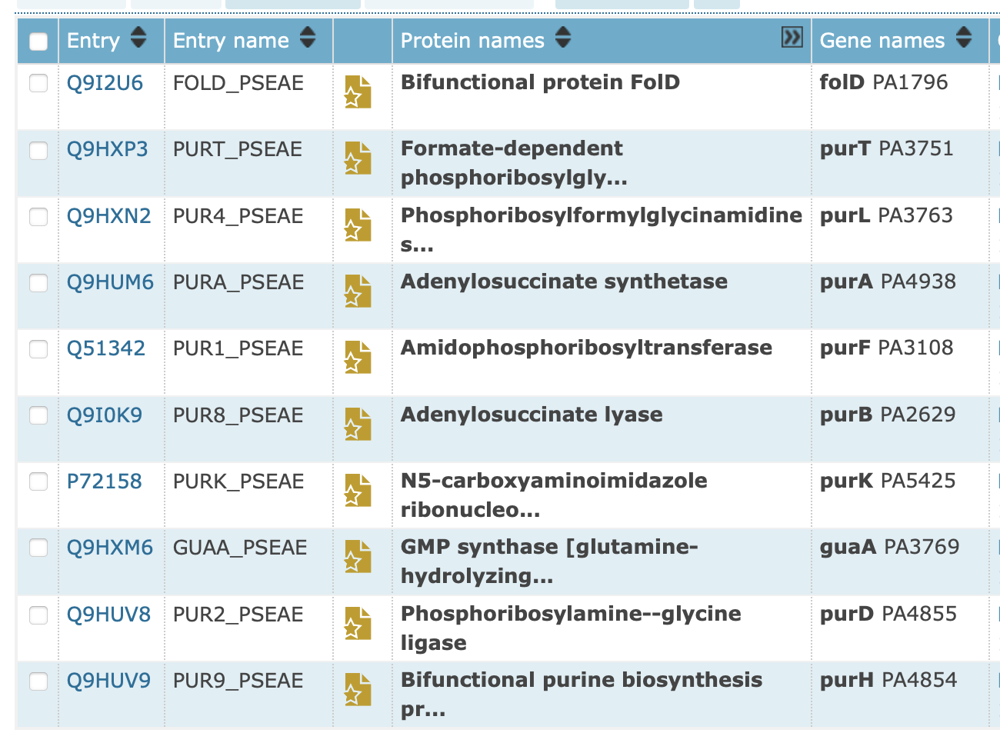

4. Find the complete genome of the selected bacterium in ENA/EMBL.

The easiest way to do this is to go to the Uniprot entry page of one of the proteins (a hyperlink in the first column) and find the word 'EMBL' there, then follow the hyperlink 'Genomic DNA'.

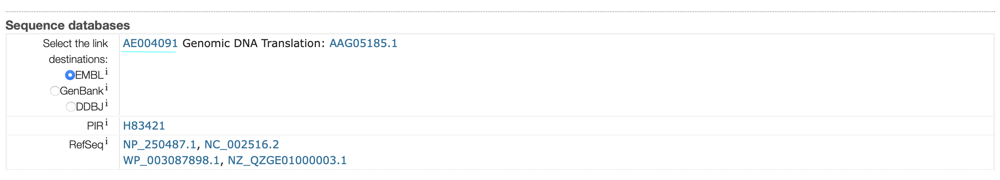

btw, AE004091 is an AC (Accession number) of this bacterium.

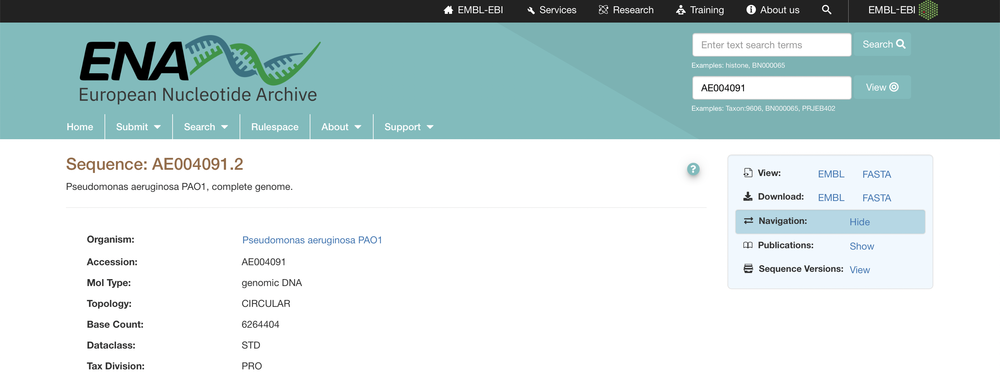

4.1. Download the full EMBL entry (on the right side 'Download: TEXT').
______________________
There is no 'TEXT' button, so we selected 'EMBL' format.

p.s. EMBL format stores sequence and its annotation together. 


5. For each of the genes of the selected proteins: find the gene in the downloaded EMBL record ..

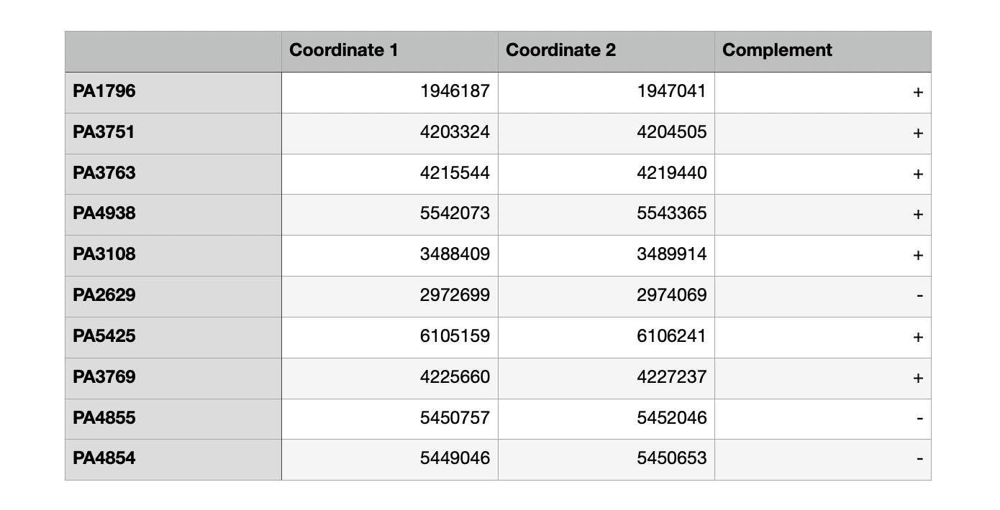

and write down the coordinates of the upstream region of 100 nucleotides (that is, 100 nucleotides from the 5' side of the starting codon of the gene) ...

p.s. do not forget that the gene can be both on the forward and the reverse chains (relatively to the EMBL entry).

For not complement (-) strands, we get the region based on the first coordinate, for complement (+) chains .. based on the second coordinate.

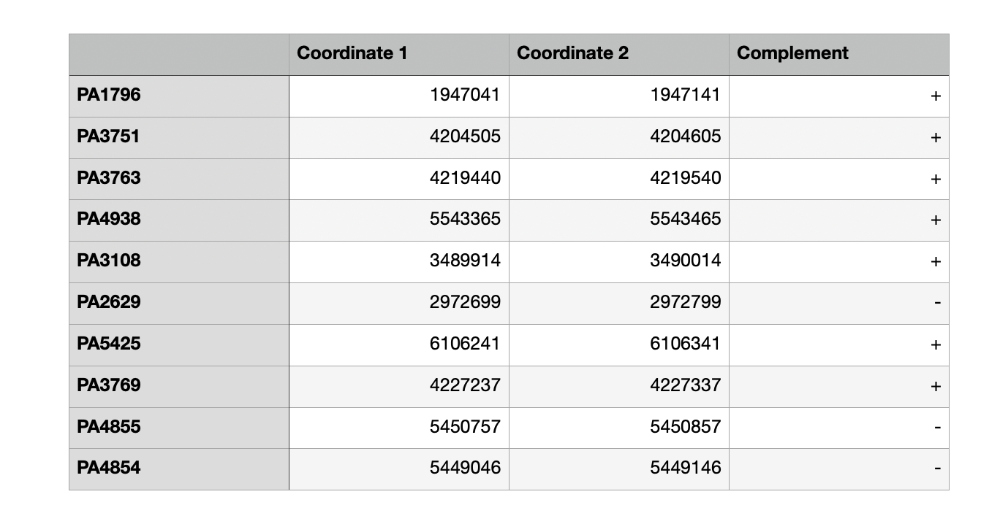

6. Cut the sequences of all the selected upstream regions (from the last table) from the EMBL file and put them in a new fasta file.


In [ ]:
# hint: there is a reverse_complement method for sequences in biopython

!pip install biopython

In [ ]:
from Bio import SeqIO
from Bio import Seq
from Bio.SeqRecord import SeqRecord

# before that, we need to convert downloaded 'txt' file into 'gbk' format manually
genome = SeqIO.read('AE004091.2.gbk','embl').seq
genome

Seq('TTTAAAGAGACCGGCGATTCTAGTGAAATCGAACGGGCAGGTCAATTTCCAACC...CCG')

In [ ]:
upstream_regions = []

ids = ['PA1796','PA3751','PA3763','PA4938','PA3108','PA2629','PA5425',
       'PA3769','PA4855','PA4854']

start_positions = [1947041,4204505,4219440,5543365,3489914,2972699,
                   6106241,4227237,5450757,5449046]

end_positions = []
for coordinate in start_positions:
  end_positions.append(coordinate + 100)

complement = ['+','+','+','+','+','-','+','+','-','-']

In [ ]:
for searching in zip(ids, start_positions, end_positions, complement):
  region = genome[searching[1]:searching[2]]
  if searching[3] == '+':
    region = region.reverse_complement()
  print(len(region), 'nt')
  print(region)
  region = SeqRecord(region, id = searching[0])
  upstream_regions.append(region)

100 nt
GAGTTACGGCAAATCCGCGGGTCGCCTCCTTTGCCCCGGGCGGCGTCCATGCGAAAATGCGCGTCCTTTTTCCACCCGATTCGATGGTTACCCTTCCGAC
100 nt
GAGGTGCTCGGTCGCTGTTTCGAGCGCGCCAAGGCGCAAGGGCTGGTCAGCGGTTCCGCCTGAAGCGGATTCCGTTTTCTTTCATTTCCGAGGTTCTTCC
100 nt
GCGGGTGCCGCCGGACGGTGCTTTACGGTAGAATGCACGGCCTCTGCGGGCCGGCCCGGCCGGCCCCCACACCTTCCCGTCTCCAGAGGCTGTTCCGACA
100 nt
GCTGGCGCTGCGCGATGGCAATTGGCAGGTGGCGCCGCTGGCGTCCTGAGATTCCGCCGGCCGCGGCCGGCATCGAACTTCCACGATGGGGACAAGTGTT
100 nt
GGGAGCCAGCGGCCCACAGGCCCTGGTCAGCTCGATGGTCCGGGACGGACCGATCGCGCTTCCCATCTTTCCAGCTTGAGCCAAGTAGGGGTTGCGTCAC
100 nt
TGCAGCTTTCCTCGCTCACCGCGGTATCCCCCGTCGATGGCCGCTATGCCGGCAAAACCAGCAGCCTGCGTCCGATCTTCAGCGAATACGGCCTGATCCG
100 nt
GGCGCTGAAGCAGTTCCGCGCCAACCAGACCGAAACCGTGCTGGACAATCCCGACCCGCGCGATGCGTGAGACAGGCTCTGAGAAGGTAAGGCTCGAACC
100 nt
CCCAACTACCGGGTTGGTTGAGGCTGATTGAAATGAGTGCTGCACGGGGCTGTTCGATTCAGCCCCGTGTCGTTTTCGAATTCCGTAGCGAGAGATGGCC
100 nt
TGAACGTACTCATCATCGGCAGCGGCGGTCGTGAACATGCCCTGGCCTGGAAAGTCGCCCAGGACCCGCGCGTGGCGAAGGTCTTCGTCGCCCCGGGCAA
100 nt
TGACCGACCAAACCACCCGCC

In [ ]:
SeqIO.write(upstream_regions,'upstream_regions.fasta','fasta')

10

7. Search for motifs using MEME.

*A motif* - .. a DNA motif is defined as a nucleic acid sequence pattern that has some biological significance such as being DNA binding sites for a regulatory protein, i.e. a transcription factor.

https://meme-suite.org/meme/

*MEME* - motif-based sequence analysis tools.

p.s. search on both the chains (by the way, specify why in the report) [on the server, there should be no check mark in 'the search given strand only' checkbox].

[In the command line version, 'revcomp' is responsible for this, you will need to specify the alphabet '-dna'.]

p.s.s. search for no more than 3 motifs.

________

the MEME was launched via the MEME website with default parameters and pasted fasta file containing upstream regions from the previus subtask.

The answer on p.s.: The search on both the chains was performed because motifs (as genes) may be located both on the + and the - strands.


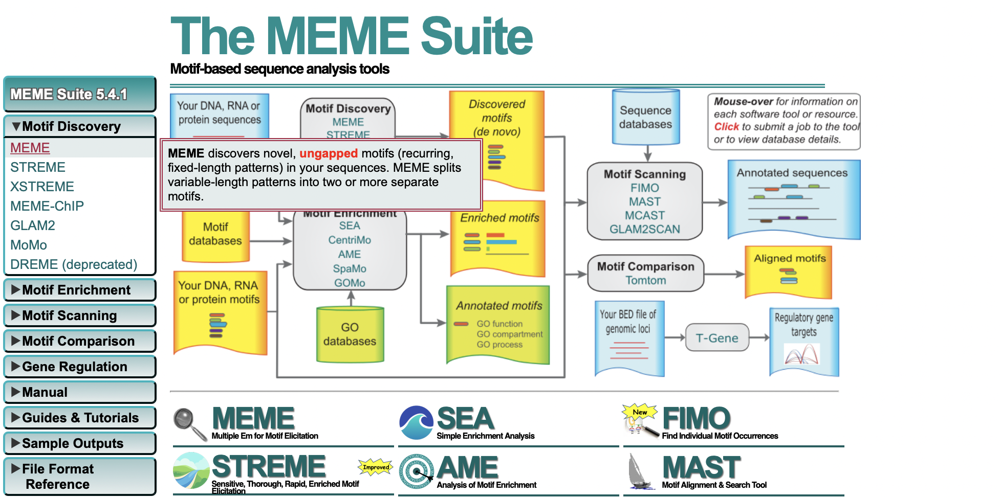

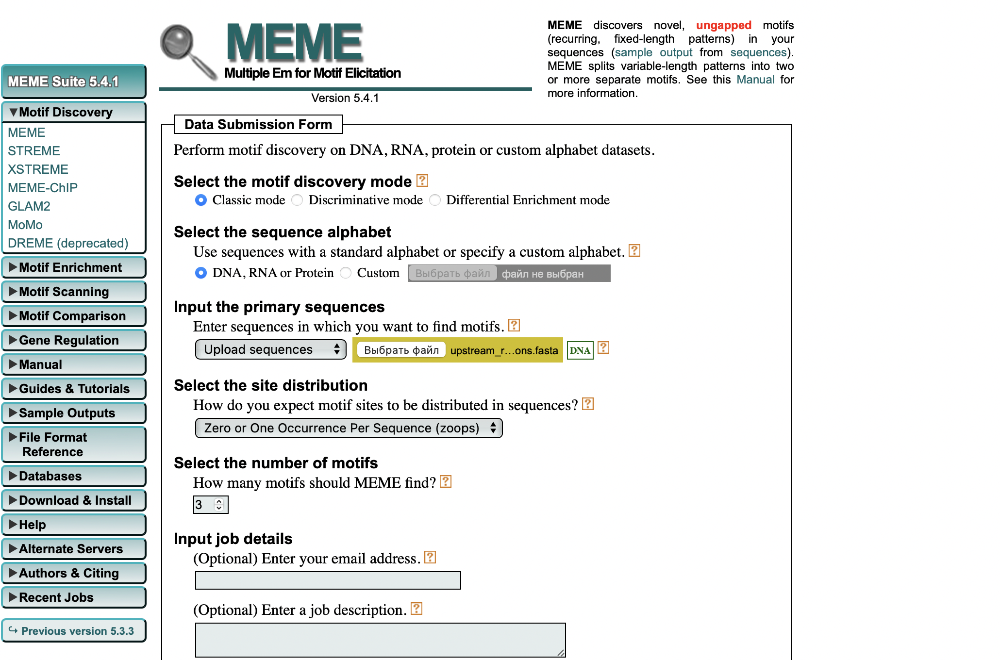

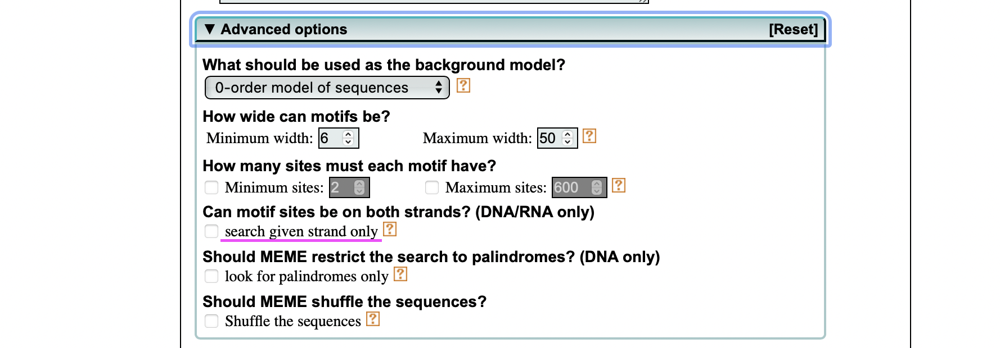

The .html file with the MEME results was retrieved..


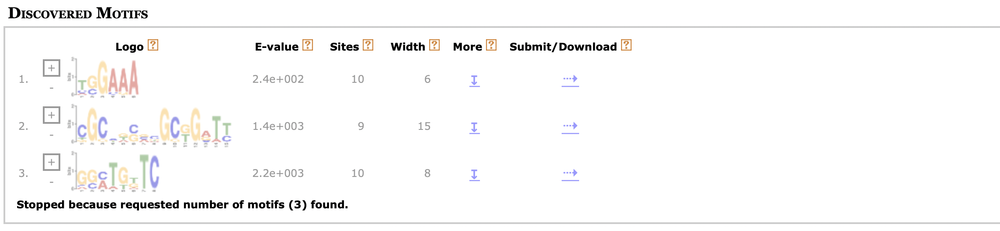

What background model was used, and why is it needed?

R: As the background model, a zero order Markov Chain was used. 

The definition of *a zero order Markov Chain* relies in that, the current state (or nucleotide) does not depends on the previous state, so there's no “memory” and every state is untied (i.e. the current nucleotide is totally independent of the previous nucleotide).

It is used while finding motifs to determine what is the probability to obtain the needed sequence base on a simple generation of a sequence of nucleotides (one nucleotide by another nucleotide) based on the nucleotide frequencies.

p.s. A zero order Markov Chain was used due to its simplicity (this is the simplest model).

More information about nth order Markov Chain usage in MEME is here https://meme-suite.org/meme/doc/bfile-format.html.

8. Analysis and conclusions.

How many motifs were found - 3 motifs (as it is shown in image above),

how many of them are good (with E-value < 0.001) - 0 motifs (the probability to get all these three motifs randomly is high),

are the motifs found in all the sequences - 1. and 3. motifs are found in all 10 sequences, 2. motif is identified in 9 sequences.

9. Comparison with real motif (compare the MEME results with the motif for E. coli). 

Before that, we need to download meme.txt from the previous task manipulations at the MEME website.

The motif for E. coli is specified here https://www.uniprot.org/uniprot/P0ACP7 (this is the E. coli PurR DNA-binding transcriptional repressor).

It is possible to compare by Tomtom - motif comparison tool with default parameters (you just need to past meme.txt file (1), select ECOLI motif database (2), select 'search with one motif (faster queue)' (3)).

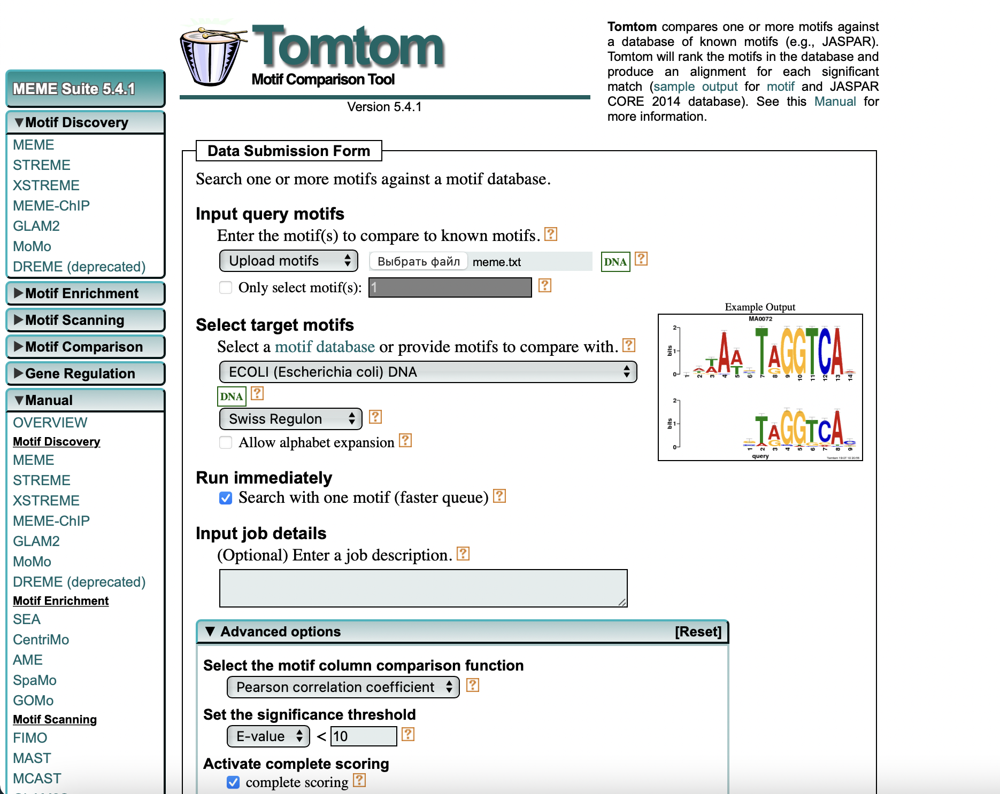

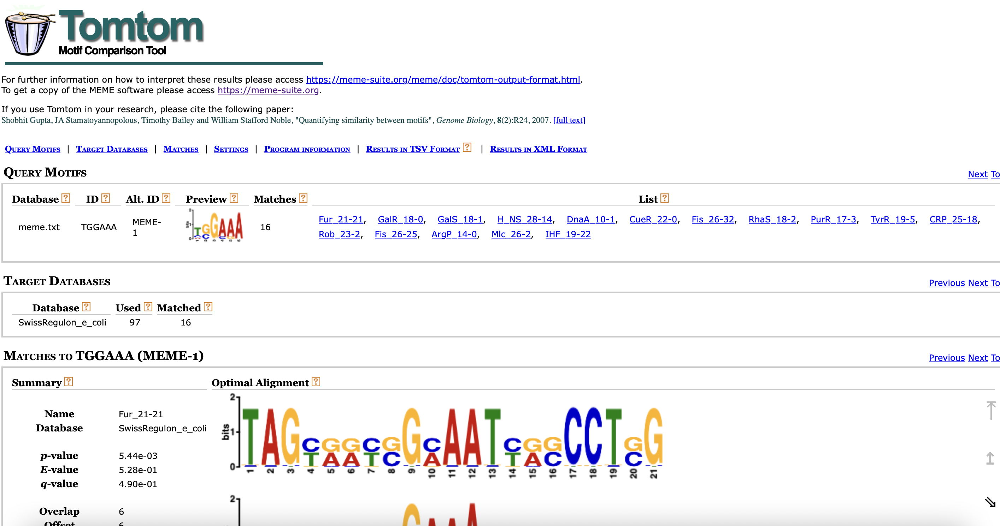

As a result, 16 matches out of 97 were retrieved.

The needed PurR motif (of E. coli) (one the 16 matches that was found) and its comparison with the motif of the considered bacterium:

it has E-value 3.31e+00 > 0.001.

The reported motif (PurR .. of E. coli) does not look quite similar to 'our' motif. It is longer (17 vs 6 nts) and possesses many variations in base scores at several positions.

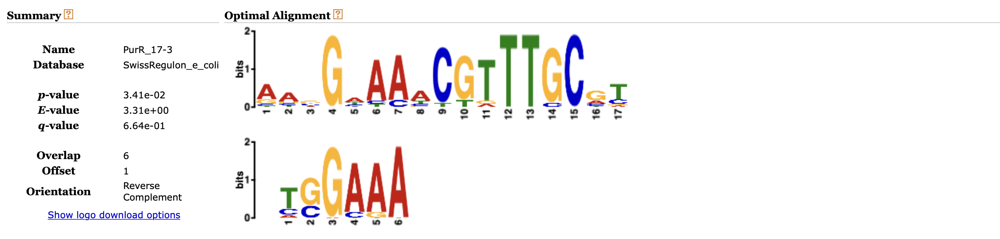

10*. Change the parameters 'maximum and minimum width', 'background model' (MEME part).

the background model: 0 -> 4,

minimum/maximum width motifs: 6 -> 5, 50 -> 65.

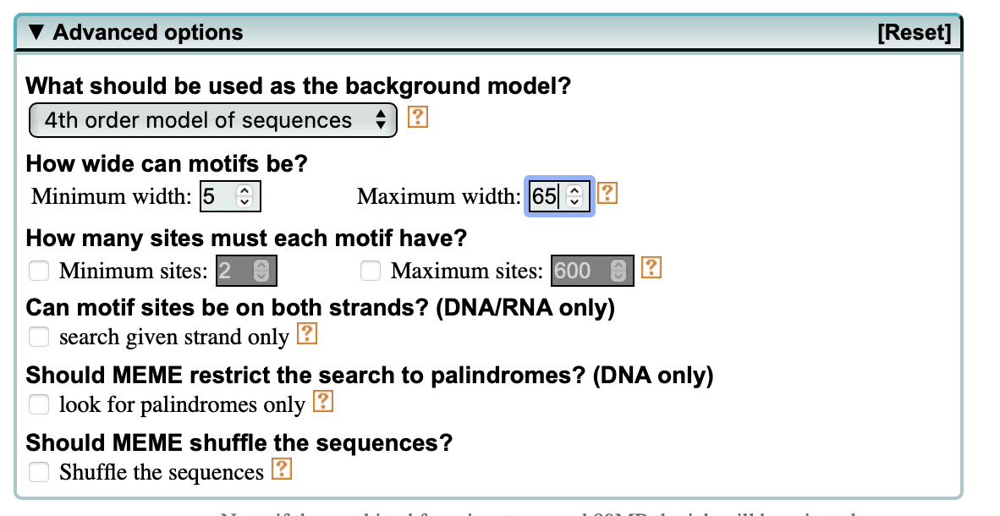

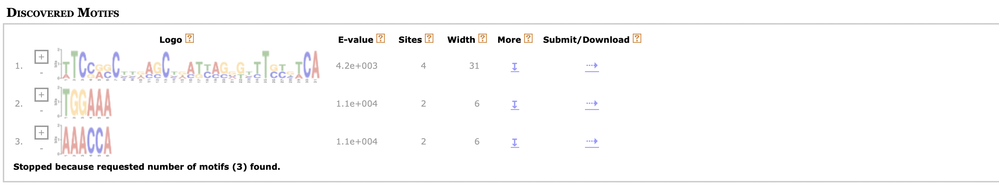

Analysis and conclusions*.

How many motifs were found - 3 motifs (as it is shown in image above),

how many of them are good (with E-value < 0.001) - 0 motifs (the probability to get all these three motifs randomly is high),

are the motifs found in all the sequences - 1. motif is found in 4 seqs, 2. and 3. motifs are found in 2 seqs only.

Let's check it with another parameters:


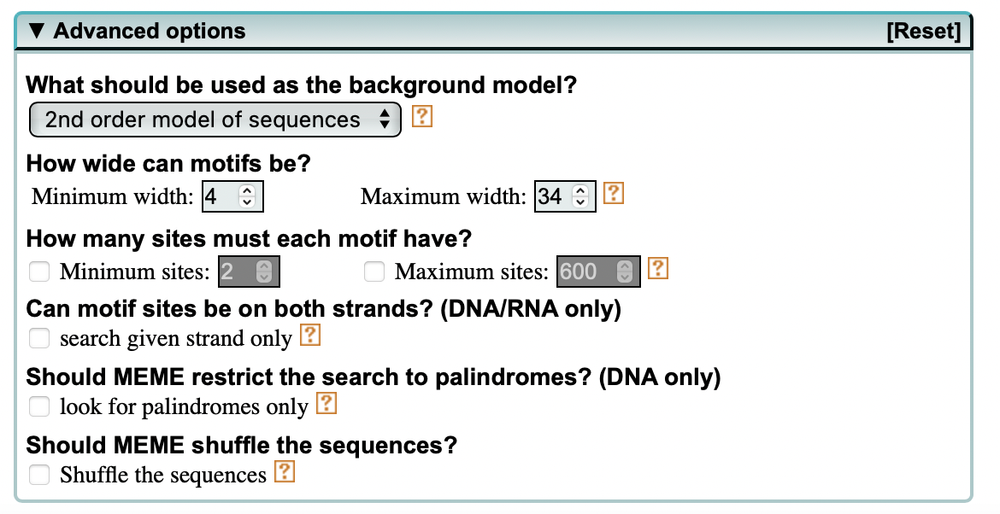

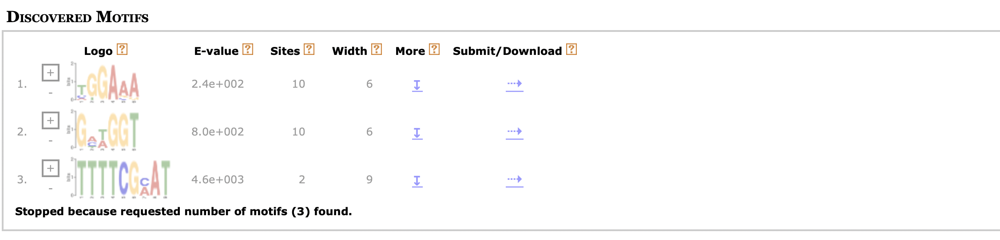

How many motifs were found - 3 motifs (as it is shown in image above),

how many of them are good (with E-value < 0.001) - 0 motifs (the probability to get all these three motifs randomly is high). However, it is interesting to note that the best E-value (2.4e+002) is the same as for the previous first (original) MEME launching.

are the motifs found in all the sequences - 1. and 2. motifs is found in all 10 seqs, 3. motif is found in 2 seqs only.

11. Upload your background consisting of all the promoter regions. 

This can be done with the 'fasta-get-markov *options* *sequence_file* *background_file*' command.

For this, you need to install MEME on your own laptop (MacOS X, for example):

1) you need to download .tar via this link https://meme-suite.org/meme/doc/download.html.

2) to do these commands: 


In [ ]:
meme_version = '5.4.0'
!tar -xvf meme-{meme_version}.tar

meme-5.4.0/
meme-5.4.0/config/
meme-5.4.0/config/compile
meme-5.4.0/config/config.guess
meme-5.4.0/config/config.sub
meme-5.4.0/config/install-sh
meme-5.4.0/config/ltmain.sh
meme-5.4.0/config/missing
meme-5.4.0/config/mkinstalldirs
meme-5.4.0/config/depcomp
meme-5.4.0/m4/
meme-5.4.0/m4/libtool.m4
meme-5.4.0/m4/ltoptions.m4
meme-5.4.0/m4/ltsugar.m4
meme-5.4.0/m4/ltversion.m4
meme-5.4.0/m4/lt~obsolete.m4
meme-5.4.0/website/
meme-5.4.0/website/css/
meme-5.4.0/website/css/component_bfile.css
meme-5.4.0/website/css/component_glam2motifs.css
meme-5.4.0/website/css/component_motifs.css
meme-5.4.0/website/css/component_sequences.css
meme-5.4.0/website/css/fasta-debug.css
meme-5.4.0/website/css/show_sequence_dbs.css
meme-5.4.0/website/css/status.css
meme-5.4.0/website/css/tomtom.css
meme-5.4.0/website/images/
meme-5.4.0/website/images/euclidean-eq.png
meme-5.4.0/website/images/logo_alignment.png
meme-5.4.0/website/images/new_icon.png
meme-5.4.0/website/images/pearson-eq.png
meme-5.4.0/website/i

In [ ]:
!cd ./meme-5.4.0 && --prefix=$HOME/meme --enable-build-libxml2 --enable-build-libxslt

checking for a BSD-compatible install... /usr/bin/install -c
checking whether build environment is sane... yes
checking for a thread-safe mkdir -p... /bin/mkdir -p
checking for gawk... no
checking for mawk... mawk
checking whether make sets $(MAKE)... yes
checking whether make supports nested variables... yes
checking whether make supports nested variables... (cached) yes
checking for gcc... gcc
checking whether the C compiler works... yes
checking for C compiler default output file name... a.out
checking for suffix of executables... 
checking whether we are cross compiling... no
checking for suffix of object files... o
checking whether we are using the GNU C compiler... yes
checking whether gcc accepts -g... yes
checking for gcc option to accept ISO C89... none needed
checking whether gcc understands -c and -o together... yes
checking whether make supports the include directive... yes (GNU style)
checking dependency style of gcc... gcc3
checking whether gcc and cc understand -c and -o

In [ ]:
!cd ./meme-5.4.0 && make

make  all-recursive
make[1]: Entering directory '/content/meme-5.4.0'
Making all in etc
make[2]: Entering directory '/content/meme-5.4.0/etc'
/bin/sed -e 's%\@SOURCE_URL\@%https://meme-suite.org%g' -e 's%\@SITE_URL\@%https://meme-suite.org/meme%g' -e 's%\@DEV_CONTACT\@%meme-suite@uw.edu%g' -e 's%\@AMIGO_URL\@%http://amigo.geneontology.org/amigo/term/GO_TERM_ID%' ame_template.html.in > ame_template.html
/bin/sed -e 's%\@SOURCE_URL\@%https://meme-suite.org%g' -e 's%\@SITE_URL\@%https://meme-suite.org/meme%g' -e 's%\@DEV_CONTACT\@%meme-suite@uw.edu%g' -e 's%\@AMIGO_URL\@%http://amigo.geneontology.org/amigo/term/GO_TERM_ID%' beadstring.xsl.in > beadstring.xsl
/bin/sed -e 's%\@SOURCE_URL\@%https://meme-suite.org%g' -e 's%\@SITE_URL\@%https://meme-suite.org/meme%g' -e 's%\@DEV_CONTACT\@%meme-suite@uw.edu%g' -e 's%\@AMIGO_URL\@%http://amigo.geneontology.org/amigo/term/GO_TERM_ID%' centrimo_template.html.in > centrimo_template.html
/bin/sed 's%tname%citation.js%' ./xsl-wrapper.in | /bin/sed '5

In [ ]:
!cd ./meme-5.4.0 && make test

make check
make[1]: Entering directory '/content/meme-5.4.0'
make  check-recursive
make[2]: Entering directory '/content/meme-5.4.0'
Making check in etc
make[3]: Entering directory '/content/meme-5.4.0/etc'
make[3]: Nothing to be done for 'check'.
make[3]: Leaving directory '/content/meme-5.4.0/etc'
Making check in src
make[3]: Entering directory '/content/meme-5.4.0/src'
make  check-recursive
make[4]: Entering directory '/content/meme-5.4.0/src'
Making check in filters
make[5]: Entering directory '/content/meme-5.4.0/src/filters'
Making check in purge
make[6]: Entering directory '/content/meme-5.4.0/src/filters/purge'
make[6]: Nothing to be done for 'check'.
make[6]: Leaving directory '/content/meme-5.4.0/src/filters/purge'
Making check in dust
make[6]: Entering directory '/content/meme-5.4.0/src/filters/dust'
make[6]: Nothing to be done for 'check'.
make[6]: Leaving directory '/content/meme-5.4.0/src/filters/dust'
make[6]: Entering directory '/content/meme-5.4.0/src/filters'
make[6]:

In [ ]:
!cd ./meme-5.4.0 && make install

make  install-recursive
make[1]: Entering directory '/content/meme-5.4.0'
Making install in etc
make[2]: Entering directory '/content/meme-5.4.0/etc'
make[3]: Entering directory '/content/meme-5.4.0/etc'
make[3]: Nothing to be done for 'install-exec-am'.
 /bin/mkdir -p '/root/meme/share/meme-5.4.0'
 /usr/bin/install -c -m 644 db_general.csv db_other_genomes.csv alphabet_utilities.js ame_doc.js ame_icon.png ame_template.css ame_template.js block_diagram.css block_diagram.js centrimo_doc.js centrimo_graph.js centrimo_icon.png centrimo_template.css centrimo_template.js citation.js discovery_doc.js cisml.css cisml-to-gff.xsl cisml-to-gff3.xsl cisml-to-html.xsl cisml-to-text.xsl delay_draw.js description_section.js dreme_icon.png dreme_template.css dreme_template.js eps_context.js fimo_doc.js gomo_doc.js generate_js_wrapped_template.pl generate_xsl_icons.pl hmm-text.xsl job_status.tmpl mast_icon.png mast_template.css mast_template.js mcast_icon.png mcast_doc.js mcast_template.css mcast_temp

In [ ]:
!export PATH=$HOME/meme/bin:$HOME/meme/libexec/meme-5.4.0:$PATH

'fasta-get-markov' estimates a Markov model from a FASTA file of sequences.

In [ ]:
# put input file in root (Google Colab)
!cd ../root/meme/libexec/meme-5.4.0/ && ./fasta-get-markov ~/upstream_regions.fasta ~/background.fasta
# the result is the file background.fasta 

10 100 100 100.0 1000


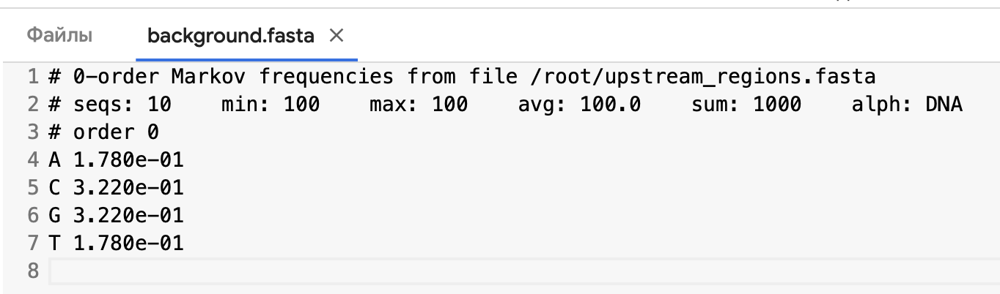

it assumes the 0-order Markov model w/ the strict model Markov background probabilities. A background model file specified all k-mer frequencies as we may see on the image above.